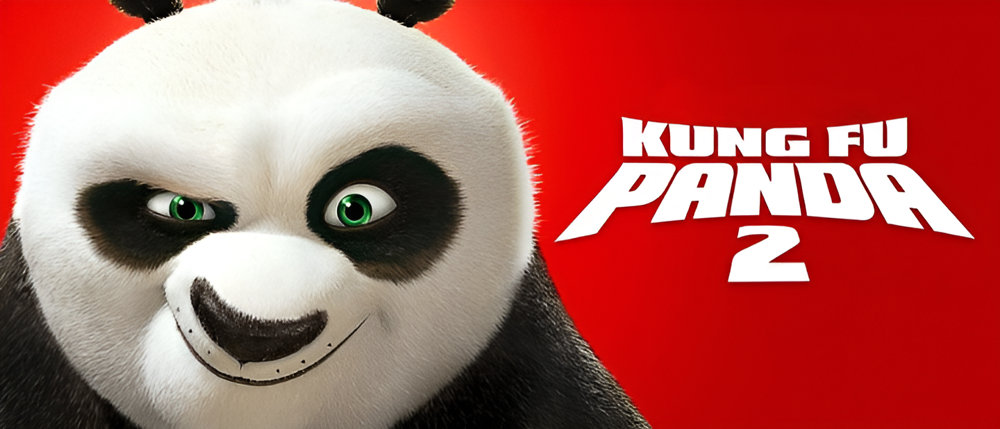

**Reading Different Data sources with the help of pandas**

In [1]:
from io import StringIO
import pandas as pd

**now lets import a csv file which is already in my notebook**

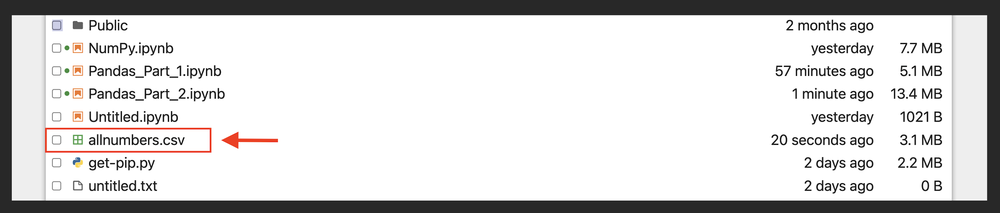

In [2]:
df=pd.read_csv('allnumbers.csv')

In [3]:
df.head()

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,...,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,...,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,...,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,...,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,...,0,0,0,0,0,0,0,0,0,0


In [4]:
type(df)

pandas.core.frame.DataFrame

**So it is converted to DataFrame**

**now we create in memory file format manually using string**

In [5]:
data=('col1,col2,col3\n'
     'x,y,1\n'
     'a,b,2\n'
     'c,d,3')

In [6]:
type(data)

str

**now we convert this string into in memory file format, thats why we imported StringIO**

In [7]:
StringIO(data)

**now it is converted to stringIo**

In [8]:
pd.read_csv(StringIO(data))

,col1,col2,col3
0,x,y,1
1,a,b,2
2,c,d,3


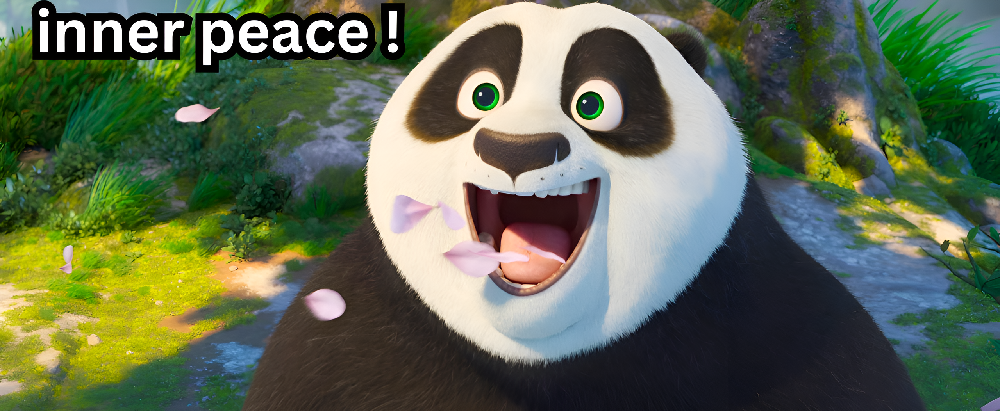

**now, we return specific numbers of column**

In [9]:
pd.read_csv(StringIO(data), usecols=['col1','col2'])

,col1,col2
0,x,y
1,a,b
2,c,d


**it is usefull when we deal with so many clolmns, like this-**

In [10]:
df=pd.read_csv('allnumbers.csv', usecols=['X0','X1','X2','X3','X4','X5'])
df.head()

,X0,X1,X2,X3,X4,X5
0,k,v,at,a,d,u
1,k,t,av,e,d,y
2,az,w,n,c,d,x
3,az,t,n,f,d,x
4,az,v,n,f,d,h


**now we convert this data to csv file**

In [11]:
df.to_csv('test.csv')

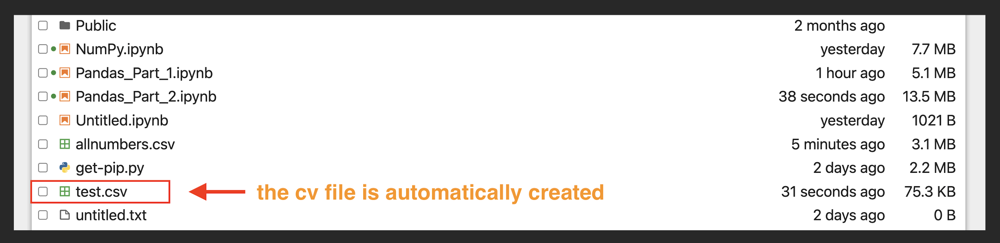

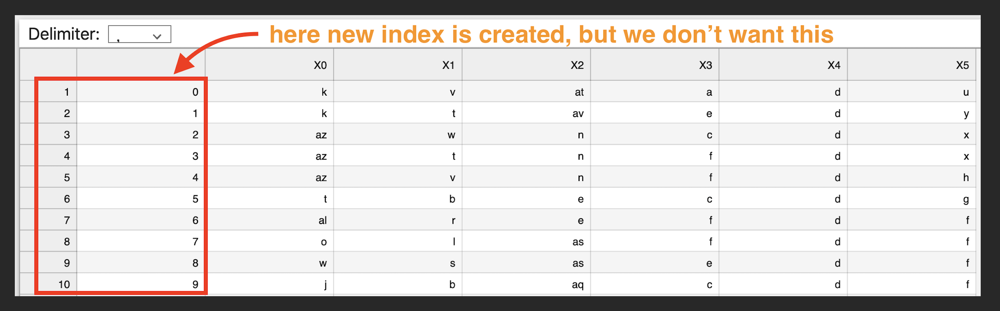

**so, we have to use index=False here**

In [12]:
df.to_csv('test.csv',index=False)

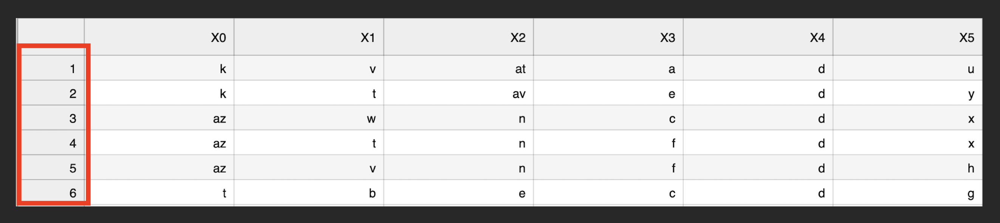

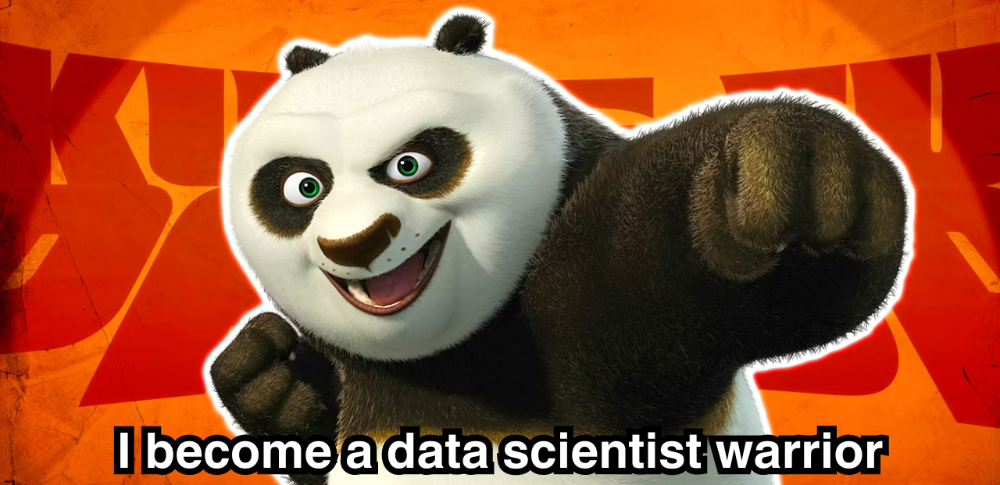

**Data Types in csv**

In [13]:
data=('a,b,c,d\n'
     '1,2,3,4\n'
     '5,6,7,8\n'
     '9,10,11')

In [14]:
df=pd.read_csv(StringIO(data))
df

,a,b,c,d
0,1,2,3,4.0
1,5,6,7,8.0
2,9,10,11,NaN


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   a       3 non-null      int64  
 1   b       3 non-null      int64  
 2   c       3 non-null      int64  
 3   d       2 non-null      float64
dtypes: float64(1), int64(3)
memory usage: 224.0 bytes


**we can change the data types**

In [16]:
df=pd.read_csv(StringIO(data),dtype='object')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   a       3 non-null      object
 1   b       3 non-null      object
 2   c       3 non-null      object
 3   d       2 non-null      object
dtypes: object(4)
memory usage: 224.0+ bytes


**we can change to flaot, int. as we wish**

**and also we can change each column data type differently using dictionary**

In [18]:
data=('a,b,c,d\n'
     '1,2,3,4\n'
     '5,6,7,8\n'
     '9,10,11')

In [19]:
df=pd.read_csv(StringIO(data),dtype={'a':int,'b':float,'c':int})
df

,a,b,c,d
0,1,2.0,3,4.0
1,5,6.0,7,8.0
2,9,10.0,11,NaN


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   a       3 non-null      int64  
 1   b       3 non-null      float64
 2   c       3 non-null      int64  
 3   d       2 non-null      float64
dtypes: float64(2), int64(2)
memory usage: 224.0 bytes


**So the data types are changed and d is float by default because of NaN value**

**we can check data type like this also**

In [21]:
df.dtypes

a      int64
b    float64
c      int64
d    float64
dtype: object

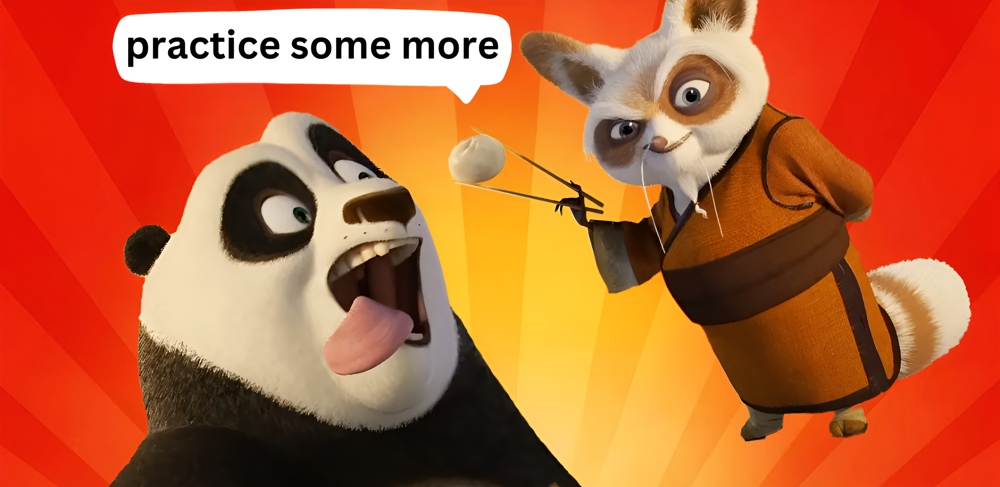

**Create a new Dataframe**

In [22]:
data = ('index,a,b,c\n'
        '4,apple,bat,5.7\n'
        '8,orange,cow, 10')

In [23]:
pd.read_csv(StringIO(data))

,index,a,b,c
0,4,apple,bat,5.7
1,8,orange,cow,10.0


**I do not want to make extra index, that's why I use index_col**

In [24]:
pd.read_csv(StringIO(data),index_col=0)

,a,b,c
index,,,
4,apple,bat,5.7
8,orange,cow,10.0


**Now we use index_col & usecols together**

**First create a new DataFrame**

In [25]:
data = ('a,b,c\n'
        '4,apple,bat\n'
        '8,orange')
pd.read_csv(StringIO(data))

,a,b,c
0,4,apple,bat
1,8,orange,NaN


In [26]:
pd.read_csv(StringIO(data),usecols=['a','b','c'], index_col=0)

,b,c
a,,
4,apple,bat
8,orange,NaN


**we can check null value count**

In [27]:
df.isnull().sum()

a    0
b    0
c    0
d    1
dtype: int64

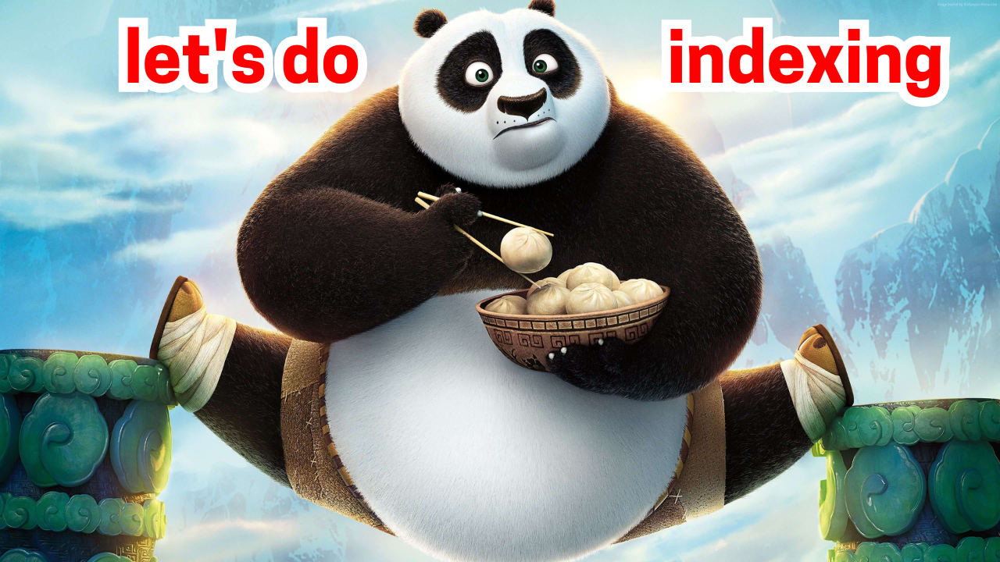

In [28]:
data=('a,b,c,d\n'
     '1,2,3,4\n'
     '5,6,7,8\n'
     '9,10,11')
df=pd.read_csv(StringIO(data))
df

,a,b,c,d
0,1,2,3,4.0
1,5,6,7,8.0
2,9,10,11,NaN


**return all value of a column**

In [29]:
df['a']

0    1
1    5
2    9
Name: a, dtype: int64

**return first value**

In [30]:
df['a'][0]

1